In [1]:
!pip install segmentation_models rembg pillow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.2/13.2 MB 86.7 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 5.8 MB/s eta 0:00:00


In [2]:
import os 
import keras
import numpy as np 
from tqdm import tqdm 
import tensorflow as tf


# Data 
import scipy.ndimage as mp
from glob import glob
import pathlib
import cv2 as cv
from keras.preprocessing.image import img_to_array, load_img
from tensorflow.image import resize
import tensorflow.image as tfi

# Model prepare
from keras.callbacks import EarlyStopping, ModelCheckpoint, Callback
from sklearn.model_selection import train_test_split

# Data visualization
import matplotlib.pyplot as plt

from rembg import remove
from PIL import Image

import subprocess
from IPython.display import FileLink, display

from keras.utils import  Sequence


2024-09-06 09:53:08.133724: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-06 09:53:08.133841: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-06 09:53:08.275040: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
%env SM_FRAMEWORK=tf.keras
import segmentation_models as smp;

env: SM_FRAMEWORK=tf.keras
Segmentation Models: using `tf.keras` framework.


In [4]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode != 0:
        print("Unable to run zip command!")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [5]:
# создание ссылок на изображения и маски
img = sorted(glob(r'../input/aisegmentcom-matting-human-datasets/clip_img/*/*/*'))
mask = sorted(glob(r'../input/aisegmentcom-matting-human-datasets/matting/*/*/*'))

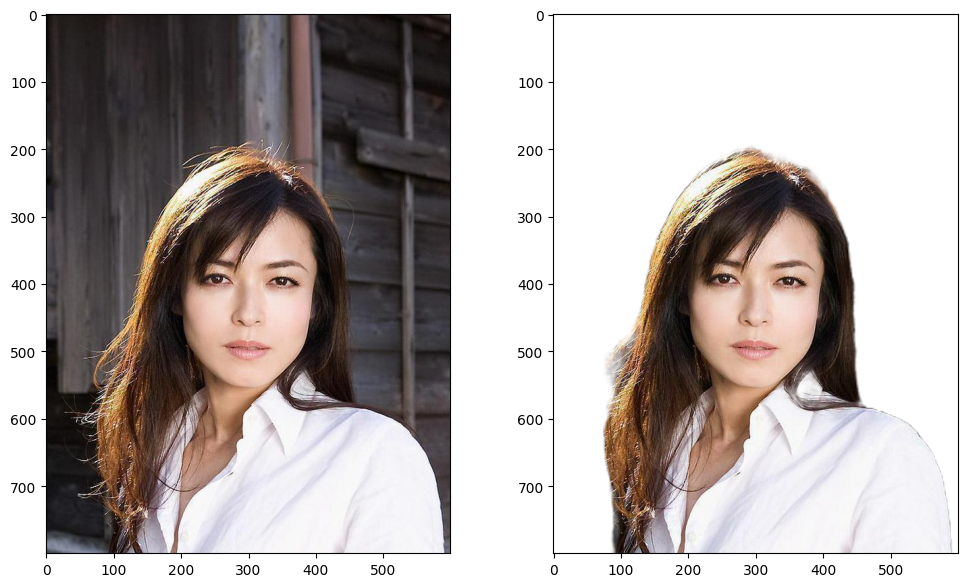

In [6]:
plt.figure(figsize=(12, 7))
plt.subplot(1,2,1)
im = plt.imread(img[99])
plt.imshow(im)
plt.subplot(1,2,2)
m = plt.imread(mask[99])
plt.imshow(m)
plt.show()

## Создание загрузчика данных, который использует не всю оперативную память а освобождает ее по ходу обучения

In [7]:
class DataGenerator(Sequence):
    'Generates data for Keras'
    
    def __init__(self, images, labels, batch_size=32, workers=1, use_multiprocessing=False, max_queue_size=None, dim=(224,224,3), shuffle=True):
        
        super().__init__(workers, use_multiprocessing, max_queue_size)  #**kwargs)
        
        self.use_multiprocessing = use_multiprocessing
        self.workers = workers
        self.max_queue_size = max_queue_size
        
        self.dim = dim
        self.images = images
        self.labels = labels
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.on_epoch_end() # 

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.images) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        list_IDs_temp = [k for k in indexes]

        # Generate data
        X, y = self.__data_generation(list_IDs_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.images))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        batch_imgs = list()
        batch_labels = list()

        # Generate data
        for i in list_IDs_temp:
            # Store sample
            img = load_img(self.images[i] ,target_size=self.dim)
            img = img_to_array(img)/255.
            batch_imgs.append(img)
            #Store class
            label = load_img(self.labels[i] ,target_size=self.dim)
            label = img_to_array(label)[:,:,0]
            label = label != 0
            label = mp.binary_erosion(mp.binary_erosion(label))
            label = mp.binary_dilation(mp.binary_dilation(mp.binary_dilation(label)))
            label = np.expand_dims((label)*1 , axis=2)
            batch_labels.append(label)
            
        return np.array(batch_imgs) ,np.array(batch_labels)

## Визуализация обучения

In [8]:
def ShowImage(image, title=None, cmap=None):
    #возвращает изображение из входа матрицы
    plt.imshow(image, cmap=cmap)
    if title is not None : plt.title(title)
    plt.axis('off')
    
class ShowProgress(Callback):
    def __init__(self, valid):
        self.valid = valid
        
    
    def on_epoch_end(self, epoch, logs):
        
        plt.figure(figsize=(15,8))
        #i = np.random.randint(valid.batch_size-1)
        
        img = valid[0][0][0:3] # так как метод предикт принимает только от 2х и более картинок
        pred_mask = self.model.predict(img)[0] #[i-1]
        
        pred_mask = np.array(pred_mask, dtype="uint8").reshape(224,224)
        mapping = cv.bitwise_and(img[0],img[0],mask=pred_mask)#[0]  i-2 i-2

        plt.subplot(1,4,1)
        ShowImage(img[0],title="Исходное изображение")
    
        plt.subplot(1,4,2)
        ShowImage(pred_mask, title="Предсказаная маска")
    
        plt.subplot(1,4,3)
        ShowImage(valid[0][1][0].reshape(224, 224), title="Истиная маска")
    
        plt.subplot(1,4,4)
        ShowImage(mapping, title="Наложеная Маска")
    
        plt.tight_layout()
        plt.show()

In [9]:
X_train, X_test, y_train, y_test = train_test_split(img, mask, test_size=0.30, random_state=44)

In [10]:
generator = DataGenerator(X_train, y_train, batch_size=32, dim=(224,224,3),shuffle=True)
valid = DataGenerator(X_test ,y_test, batch_size=32, dim=(224,224,3), shuffle=True)

## Обучение

In [11]:
callback = [EarlyStopping(
    monitor='IoU', #
    min_delta=0,
    patience=0,
    verbose=0,
    mode='auto',
    baseline=None,
    restore_best_weights=False,
    start_from_epoch=30
), ShowProgress(valid)]
# рання остановка при равенстве валидационного лоса лосу тренировочных данных

In [12]:
BACKBONE = 'efficientnetb0'
segmodel = smp.FPN(backbone_name = BACKBONE, classes=1, activation='relu',encoder_weights ='imagenet')

16804768/16804768 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Epoch 1/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 17s 17s/step/step - IoU: 0.4998 - accuracy: 0.9626 - loss: 0.13


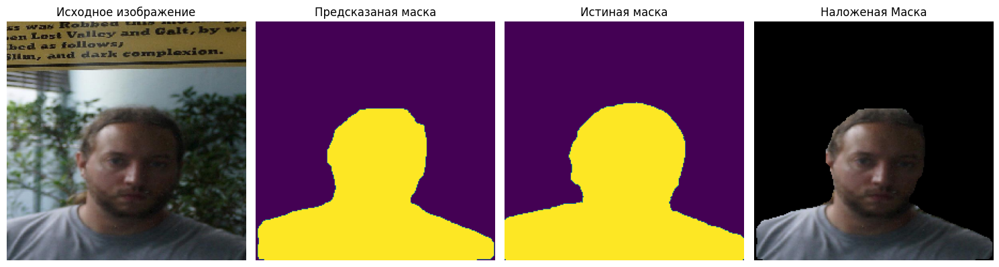

753/753 ━━━━━━━━━━━━━━━━━━━━ 1150s 1s/step - IoU: 0.4996 - accuracy: 0.9626 - loss: 0.1382 - val_IoU: 0.5188 - val_accuracy: 0.9699 - val_loss: 0.0977
Epoch 2/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step/step - IoU: 0.4766 - accuracy: 0.9583 - loss: 0.121


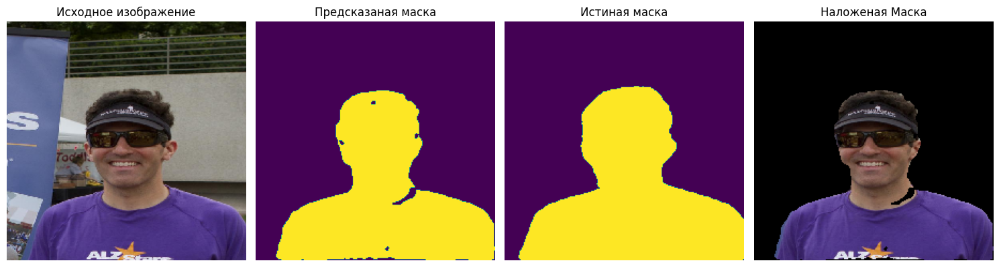

753/753 ━━━━━━━━━━━━━━━━━━━━ 932s 1s/step - IoU: 0.4764 - accuracy: 0.9583 - loss: 0.1217 - val_IoU: 0.5789 - val_accuracy: 0.9764 - val_loss: 0.0810
Epoch 3/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step/step - IoU: 0.5594 - accuracy: 0.9735 - loss: 0.083


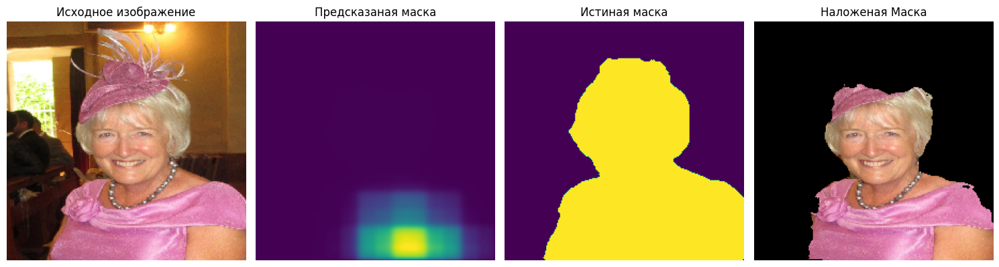

753/753 ━━━━━━━━━━━━━━━━━━━━ 912s 1s/step - IoU: 0.5591 - accuracy: 0.9735 - loss: 0.0837 - val_IoU: 0.5079 - val_accuracy: 0.9686 - val_loss: 0.1474
Epoch 4/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step/step - IoU: 0.5689 - accuracy: 0.9746 - loss: 0.080


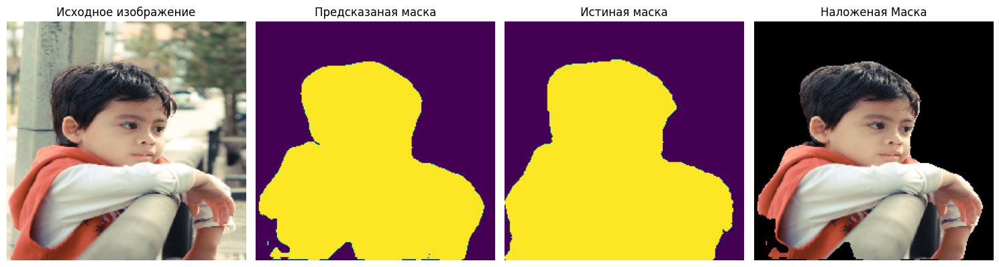

753/753 ━━━━━━━━━━━━━━━━━━━━ 897s 1s/step - IoU: 0.5686 - accuracy: 0.9746 - loss: 0.0807 - val_IoU: 0.5393 - val_accuracy: 0.9723 - val_loss: 0.1033
Epoch 5/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step/step - IoU: 0.5835 - accuracy: 0.9763 - loss: 0.076


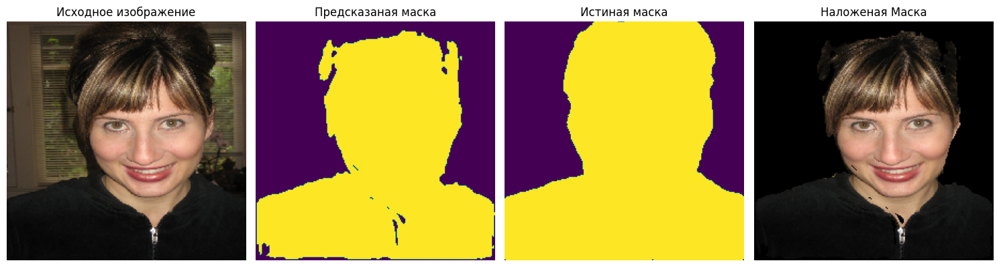

753/753 ━━━━━━━━━━━━━━━━━━━━ 956s 1s/step - IoU: 0.5832 - accuracy: 0.9763 - loss: 0.0763 - val_IoU: 0.6028 - val_accuracy: 0.9786 - val_loss: 0.0702
Epoch 6/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step/step - IoU: 0.5646 - accuracy: 0.9743 - loss: 0.080


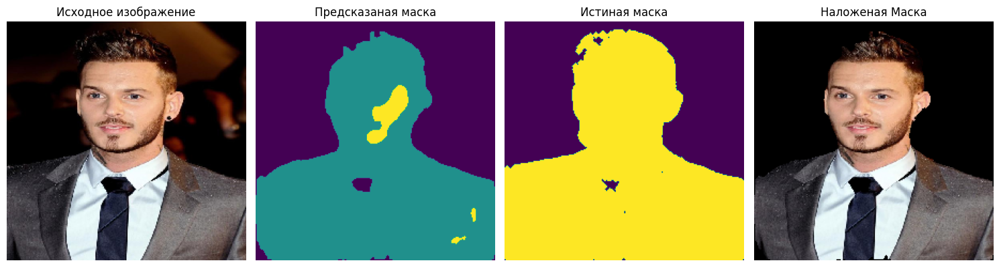

753/753 ━━━━━━━━━━━━━━━━━━━━ 1003s 1s/step - IoU: 0.5643 - accuracy: 0.9743 - loss: 0.0804 - val_IoU: 0.6020 - val_accuracy: 0.9785 - val_loss: 0.0698
Epoch 7/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step/step - IoU: 0.6014 - accuracy: 0.9784 - loss: 0.067


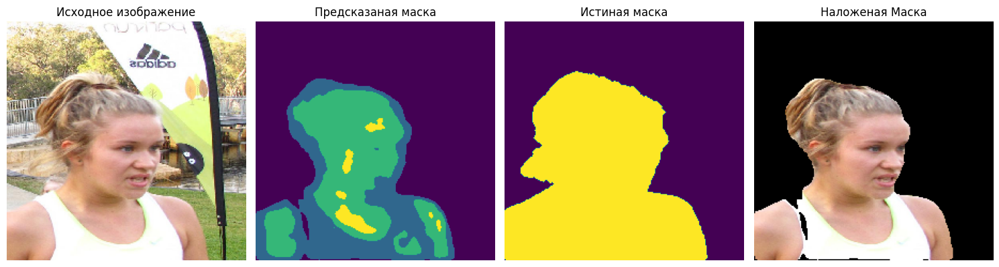

753/753 ━━━━━━━━━━━━━━━━━━━━ 960s 1s/step - IoU: 0.6011 - accuracy: 0.9784 - loss: 0.0677 - val_IoU: 0.5916 - val_accuracy: 0.9776 - val_loss: 0.0716
Epoch 8/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step/step - IoU: 0.5868 - accuracy: 0.9765 - loss: 0.072


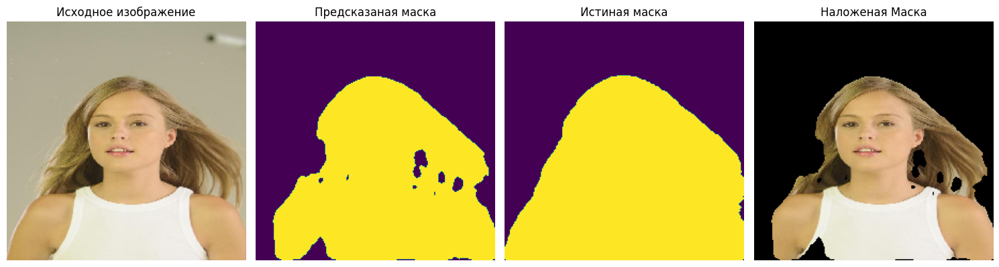

753/753 ━━━━━━━━━━━━━━━━━━━━ 964s 1s/step - IoU: 0.5865 - accuracy: 0.9765 - loss: 0.0729 - val_IoU: 0.5018 - val_accuracy: 0.9678 - val_loss: 0.0998
Epoch 9/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step/step - IoU: 0.5863 - accuracy: 0.9765 - loss: 0.073


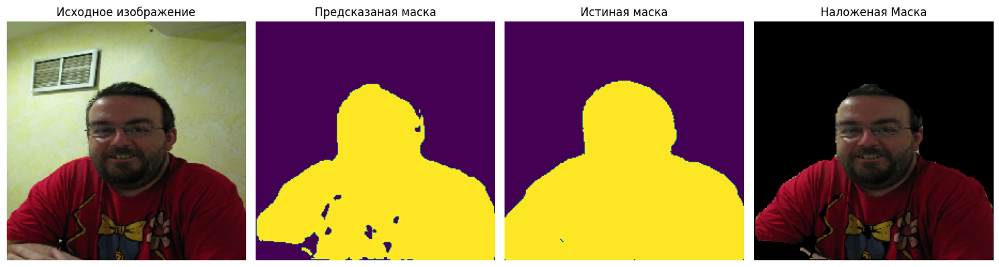

753/753 ━━━━━━━━━━━━━━━━━━━━ 1031s 1s/step - IoU: 0.5860 - accuracy: 0.9765 - loss: 0.0735 - val_IoU: 0.5946 - val_accuracy: 0.9779 - val_loss: 0.0689
Epoch 10/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step/step - IoU: 0.6173 - accuracy: 0.9799 - loss: 0.062


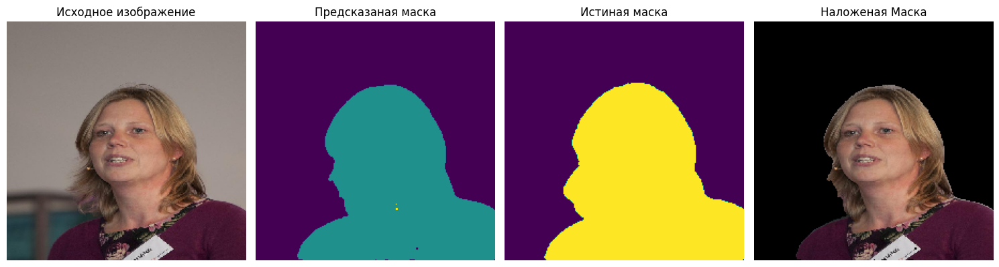

753/753 ━━━━━━━━━━━━━━━━━━━━ 956s 1s/step - IoU: 0.6170 - accuracy: 0.9799 - loss: 0.0621 - val_IoU: 0.6299 - val_accuracy: 0.9809 - val_loss: 0.0609
Epoch 11/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step/step - IoU: 0.6149 - accuracy: 0.9795 - loss: 0.062


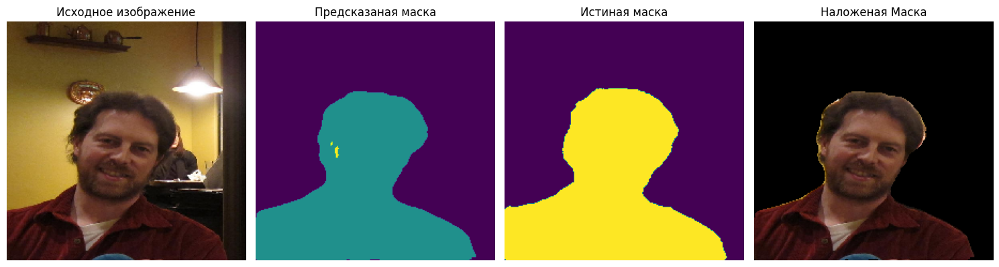

753/753 ━━━━━━━━━━━━━━━━━━━━ 901s 1s/step - IoU: 0.6146 - accuracy: 0.9795 - loss: 0.0623 - val_IoU: 0.6363 - val_accuracy: 0.9815 - val_loss: 0.0594
Epoch 12/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step/step - IoU: 0.5991 - accuracy: 0.9776 - loss: 0.067


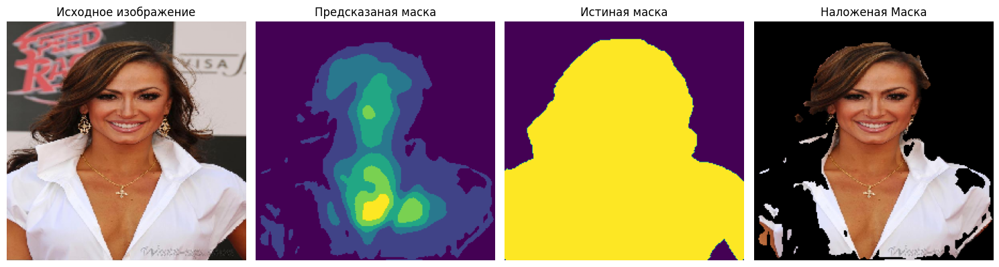

753/753 ━━━━━━━━━━━━━━━━━━━━ 858s 1s/step - IoU: 0.5988 - accuracy: 0.9776 - loss: 0.0672 - val_IoU: 0.5384 - val_accuracy: 0.9722 - val_loss: 0.0936
Epoch 13/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step/step - IoU: 0.5499 - accuracy: 0.9723 - loss: 0.084


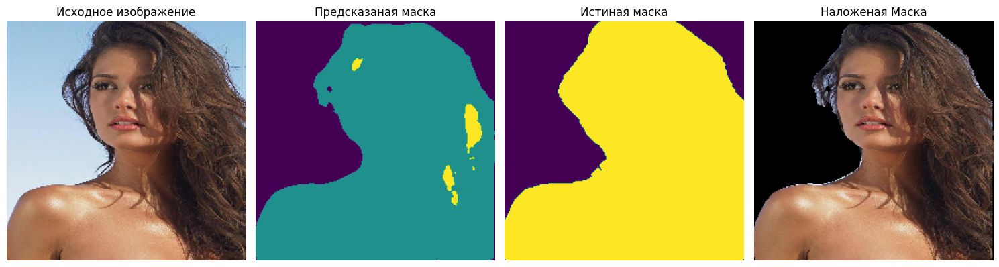

753/753 ━━━━━━━━━━━━━━━━━━━━ 865s 1s/step - IoU: 0.5497 - accuracy: 0.9723 - loss: 0.0844 - val_IoU: 0.5824 - val_accuracy: 0.9767 - val_loss: 0.0749
Epoch 14/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step/step - IoU: 0.6007 - accuracy: 0.9780 - loss: 0.067


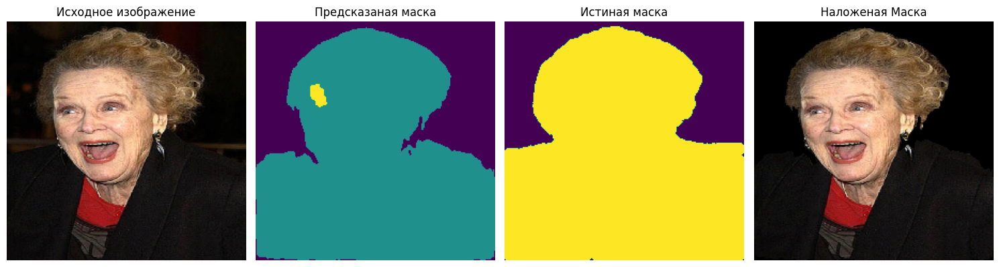

753/753 ━━━━━━━━━━━━━━━━━━━━ 864s 1s/step - IoU: 0.6004 - accuracy: 0.9780 - loss: 0.0677 - val_IoU: 0.6155 - val_accuracy: 0.9797 - val_loss: 0.0654
Epoch 15/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step/step - IoU: 0.5955 - accuracy: 0.9778 - loss: 0.070


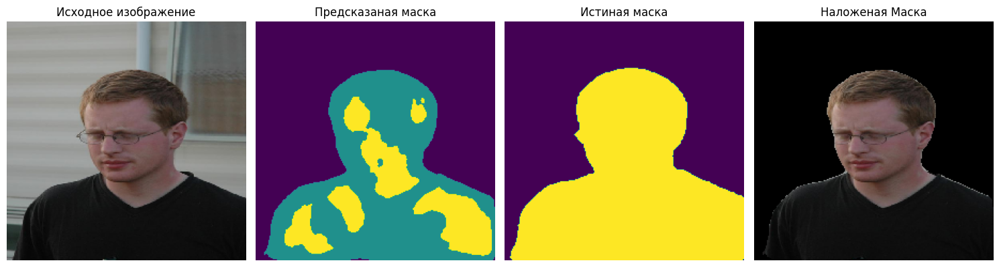

753/753 ━━━━━━━━━━━━━━━━━━━━ 869s 1s/step - IoU: 0.5952 - accuracy: 0.9778 - loss: 0.0701 - val_IoU: 0.6258 - val_accuracy: 0.9806 - val_loss: 0.0628
Epoch 16/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step/step - IoU: 0.5687 - accuracy: 0.9745 - loss: 0.077


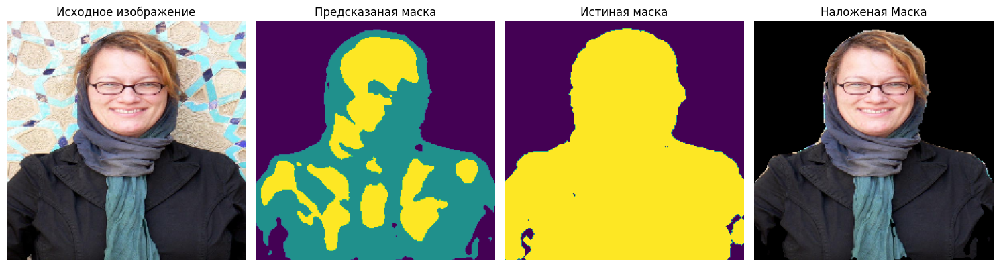

753/753 ━━━━━━━━━━━━━━━━━━━━ 916s 1s/step - IoU: 0.5685 - accuracy: 0.9745 - loss: 0.0770 - val_IoU: 0.6177 - val_accuracy: 0.9799 - val_loss: 0.0644
Epoch 17/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step/step - IoU: 0.6183 - accuracy: 0.9799 - loss: 0.060


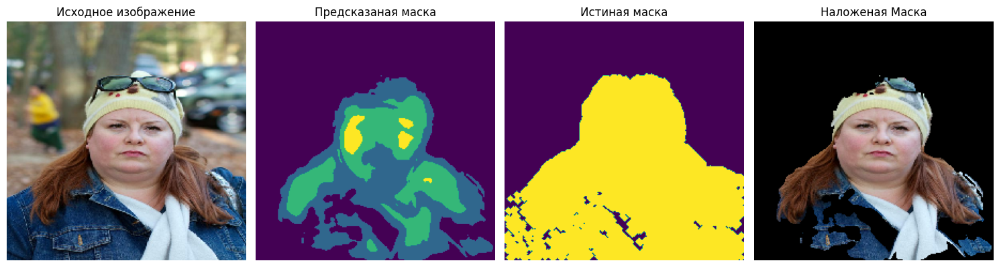

753/753 ━━━━━━━━━━━━━━━━━━━━ 952s 1s/step - IoU: 0.6180 - accuracy: 0.9799 - loss: 0.0608 - val_IoU: 0.5948 - val_accuracy: 0.9779 - val_loss: 0.0755
Epoch 18/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step/step - IoU: 0.5858 - accuracy: 0.9770 - loss: 0.068


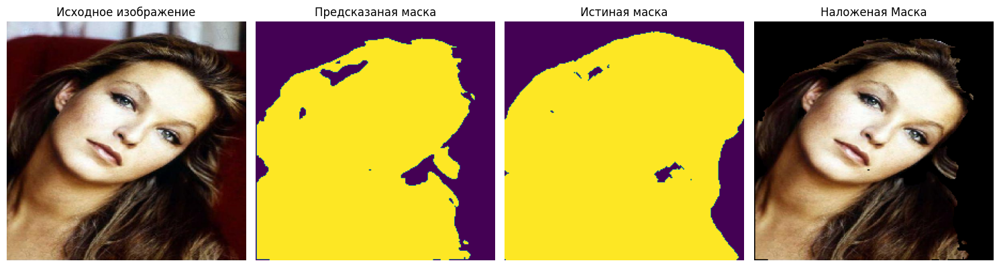

753/753 ━━━━━━━━━━━━━━━━━━━━ 972s 1s/step - IoU: 0.5855 - accuracy: 0.9770 - loss: 0.0687 - val_IoU: 0.6064 - val_accuracy: 0.9789 - val_loss: 0.0672
Epoch 19/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step/step - IoU: 0.6037 - accuracy: 0.9787 - loss: 0.065


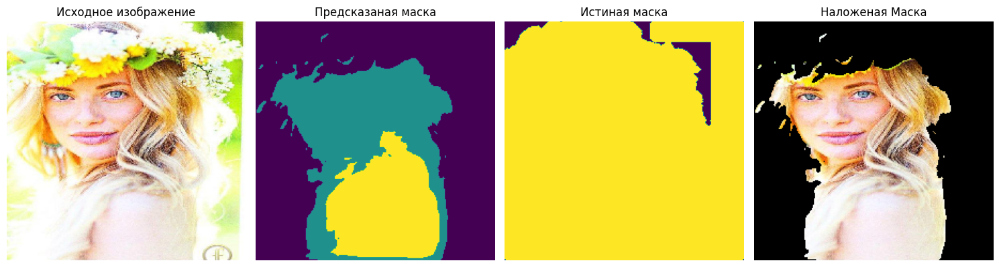

753/753 ━━━━━━━━━━━━━━━━━━━━ 998s 1s/step - IoU: 0.6034 - accuracy: 0.9787 - loss: 0.0650 - val_IoU: 0.6331 - val_accuracy: 0.9812 - val_loss: 0.0702
Epoch 20/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step/step - IoU: 0.6094 - accuracy: 0.9795 - loss: 0.060


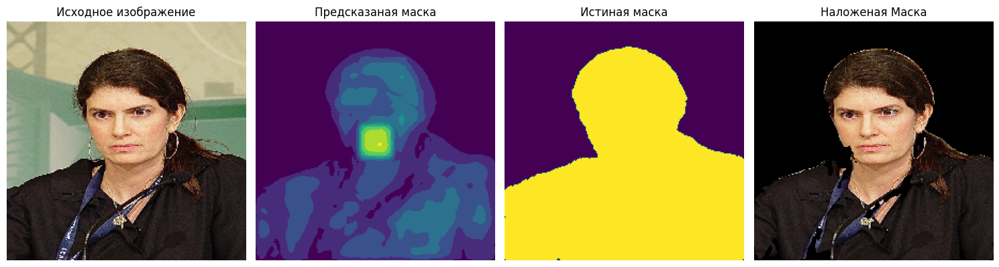

753/753 ━━━━━━━━━━━━━━━━━━━━ 981s 1s/step - IoU: 0.6091 - accuracy: 0.9795 - loss: 0.0608 - val_IoU: 0.6112 - val_accuracy: 0.9794 - val_loss: 0.0717
Epoch 21/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/stepep - IoU: 0.6132 - accuracy: 0.9794 - loss: 0.061


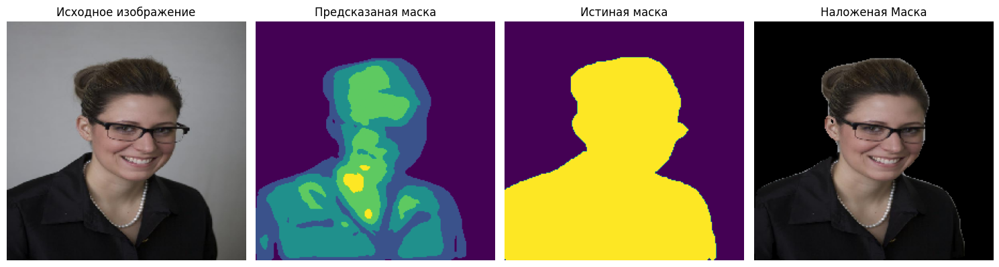

753/753 ━━━━━━━━━━━━━━━━━━━━ 1064s 1s/step - IoU: 0.6129 - accuracy: 0.9794 - loss: 0.0612 - val_IoU: 0.6006 - val_accuracy: 0.9784 - val_loss: 0.0687
Epoch 22/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step/step - IoU: 0.6341 - accuracy: 0.9815 - loss: 0.052


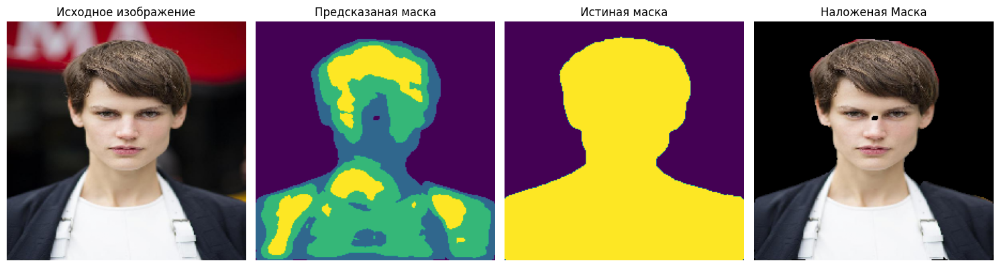

753/753 ━━━━━━━━━━━━━━━━━━━━ 990s 1s/step - IoU: 0.6338 - accuracy: 0.9815 - loss: 0.0527 - val_IoU: 0.6175 - val_accuracy: 0.9799 - val_loss: 0.0691
Epoch 23/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step/step - IoU: 0.5983 - accuracy: 0.9782 - loss: 0.061


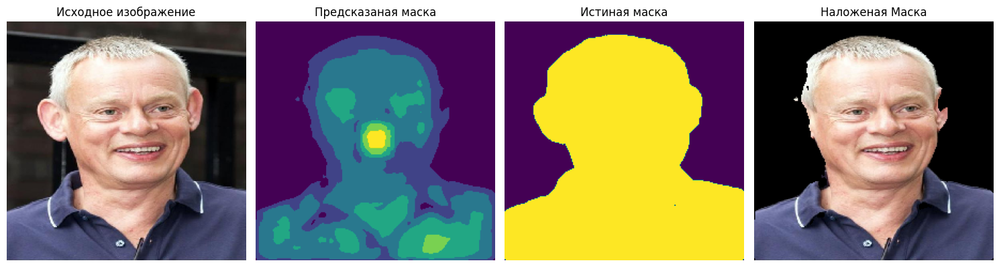

753/753 ━━━━━━━━━━━━━━━━━━━━ 978s 1s/step - IoU: 0.5980 - accuracy: 0.9782 - loss: 0.0611 - val_IoU: 0.5923 - val_accuracy: 0.9777 - val_loss: 0.0843
Epoch 24/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step/step - IoU: 0.6473 - accuracy: 0.9826 - loss: 0.048


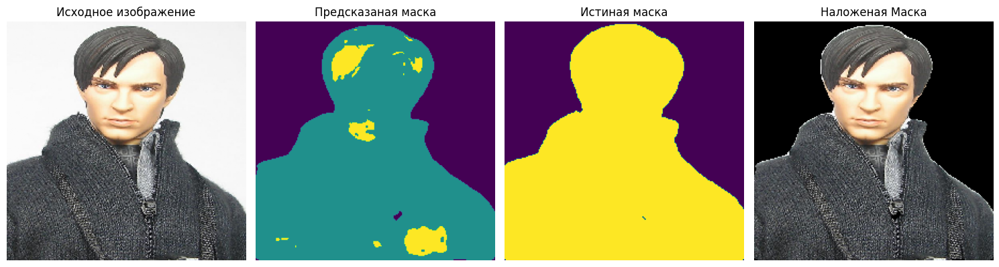

753/753 ━━━━━━━━━━━━━━━━━━━━ 913s 1s/step - IoU: 0.6471 - accuracy: 0.9826 - loss: 0.0483 - val_IoU: 0.6163 - val_accuracy: 0.9798 - val_loss: 0.0698
Epoch 25/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step/step - IoU: 0.6506 - accuracy: 0.9831 - loss: 0.047


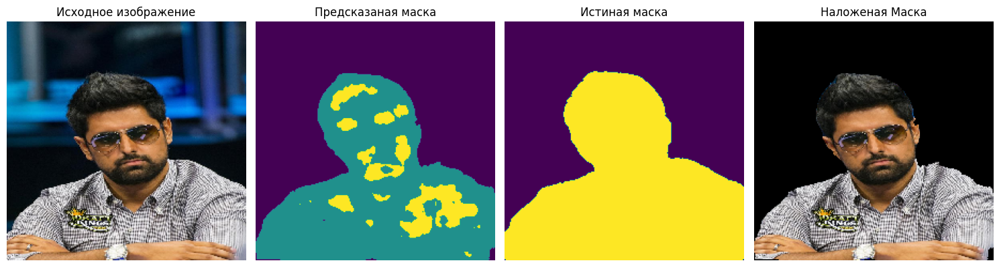

753/753 ━━━━━━━━━━━━━━━━━━━━ 1016s 1s/step - IoU: 0.6503 - accuracy: 0.9831 - loss: 0.0479 - val_IoU: 0.6139 - val_accuracy: 0.9796 - val_loss: 0.0711
Epoch 26/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step/step - IoU: 0.6357 - accuracy: 0.9817 - loss: 0.049


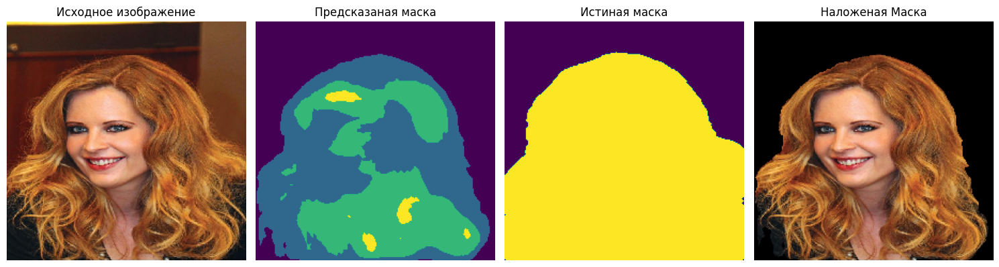

753/753 ━━━━━━━━━━━━━━━━━━━━ 965s 1s/step - IoU: 0.6354 - accuracy: 0.9817 - loss: 0.0499 - val_IoU: 0.6240 - val_accuracy: 0.9804 - val_loss: 0.0763
Epoch 27/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step/step - IoU: 0.5929 - accuracy: 0.9779 - loss: 0.058


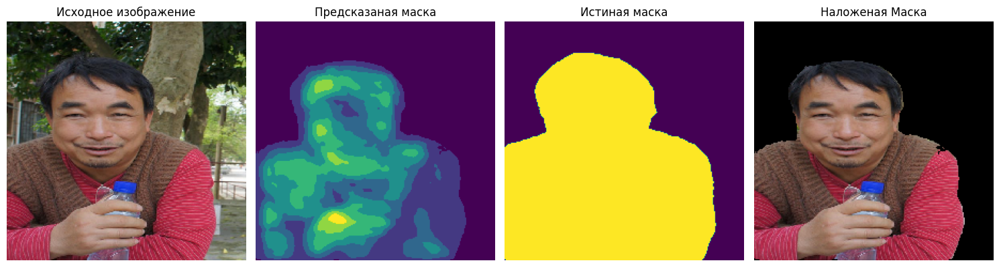

753/753 ━━━━━━━━━━━━━━━━━━━━ 916s 1s/step - IoU: 0.5926 - accuracy: 0.9779 - loss: 0.0584 - val_IoU: 0.6058 - val_accuracy: 0.9789 - val_loss: 0.0700
Epoch 28/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step/step - IoU: 0.6615 - accuracy: 0.9840 - loss: 0.043


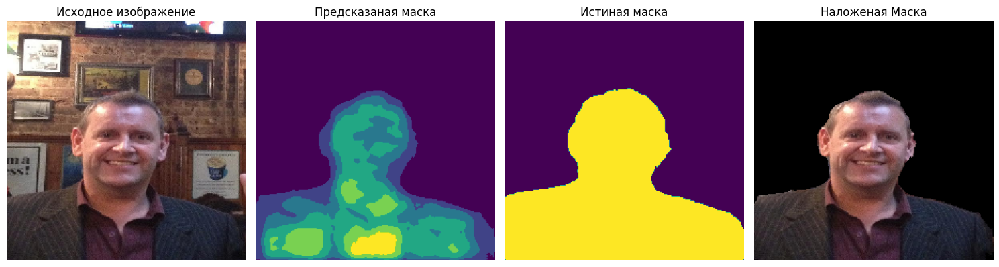

753/753 ━━━━━━━━━━━━━━━━━━━━ 899s 1s/step - IoU: 0.6612 - accuracy: 0.9840 - loss: 0.0438 - val_IoU: 0.6202 - val_accuracy: 0.9801 - val_loss: 0.0777
Epoch 29/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step/step - IoU: 0.6593 - accuracy: 0.9837 - loss: 0.044


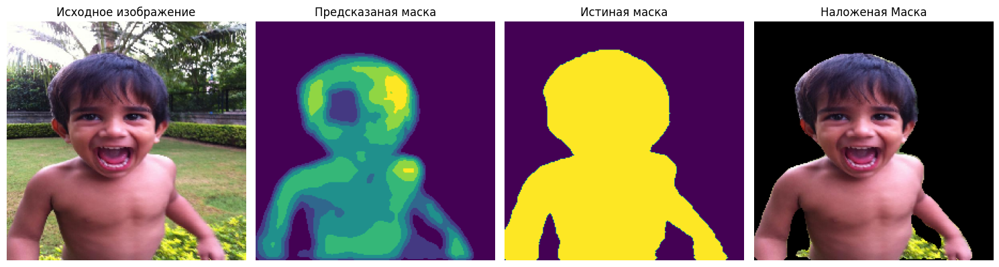

753/753 ━━━━━━━━━━━━━━━━━━━━ 893s 1s/step - IoU: 0.6590 - accuracy: 0.9837 - loss: 0.0443 - val_IoU: 0.5952 - val_accuracy: 0.9779 - val_loss: 0.0980
Epoch 30/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step/step - IoU: 0.6550 - accuracy: 0.9830 - loss: 0.046


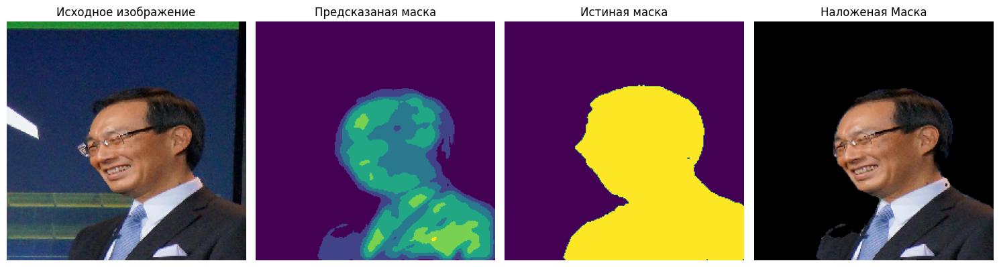

753/753 ━━━━━━━━━━━━━━━━━━━━ 852s 1s/step - IoU: 0.6547 - accuracy: 0.9830 - loss: 0.0469 - val_IoU: 0.6046 - val_accuracy: 0.9788 - val_loss: 0.0874
Epoch 31/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step/step - IoU: 0.6359 - accuracy: 0.9819 - loss: 0.049


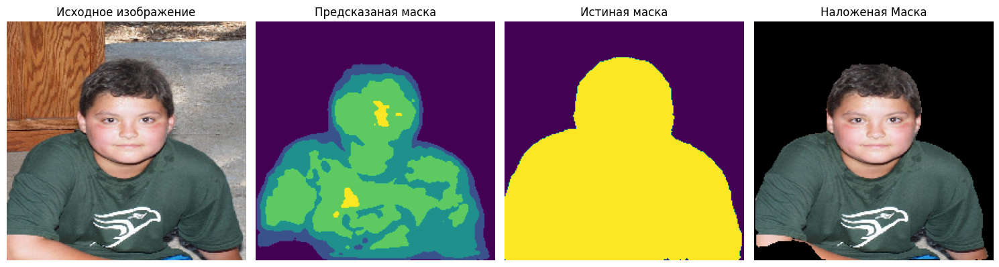

753/753 ━━━━━━━━━━━━━━━━━━━━ 907s 1s/step - IoU: 0.6356 - accuracy: 0.9819 - loss: 0.0490 - val_IoU: 0.5153 - val_accuracy: 0.9695 - val_loss: 0.0922
Epoch 32/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step/step - IoU: 0.6361 - accuracy: 0.9813 - loss: 0.050


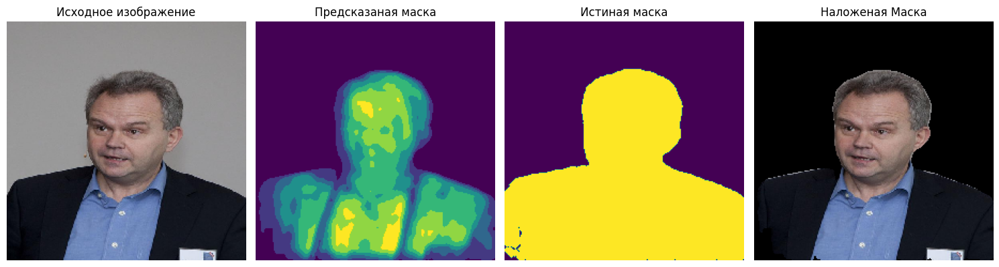

753/753 ━━━━━━━━━━━━━━━━━━━━ 889s 1s/step - IoU: 0.6359 - accuracy: 0.9813 - loss: 0.0506 - val_IoU: 0.6216 - val_accuracy: 0.9802 - val_loss: 0.0771
Epoch 33/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step/step - IoU: 0.6448 - accuracy: 0.9825 - loss: 0.047


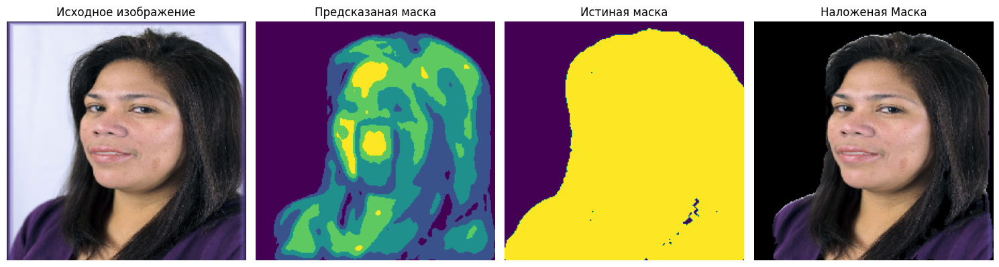

753/753 ━━━━━━━━━━━━━━━━━━━━ 894s 1s/step - IoU: 0.6445 - accuracy: 0.9825 - loss: 0.0476 - val_IoU: 0.6042 - val_accuracy: 0.9787 - val_loss: 0.0846
Epoch 34/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step/step - IoU: 0.6610 - accuracy: 0.9836 - loss: 0.044


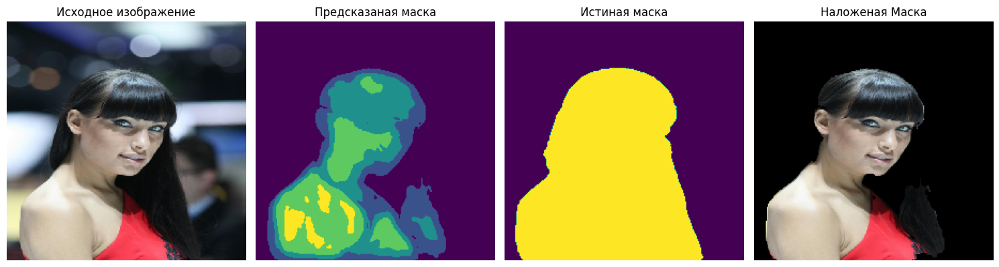

753/753 ━━━━━━━━━━━━━━━━━━━━ 891s 1s/step - IoU: 0.6607 - accuracy: 0.9836 - loss: 0.0440 - val_IoU: 0.6305 - val_accuracy: 0.9810 - val_loss: 0.0919
Epoch 35/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step/step - IoU: 0.6854 - accuracy: 0.9855 - loss: 0.039


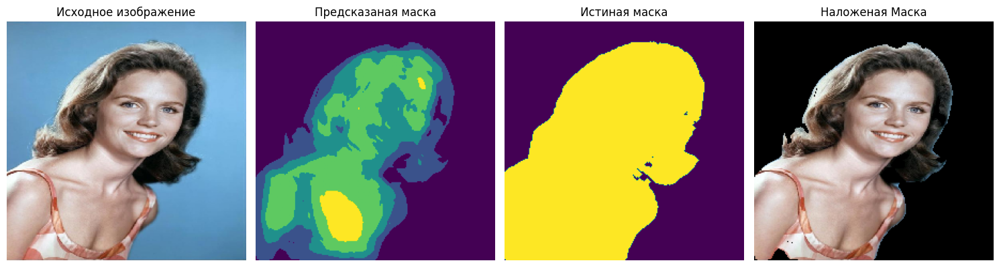

753/753 ━━━━━━━━━━━━━━━━━━━━ 899s 1s/step - IoU: 0.6851 - accuracy: 0.9855 - loss: 0.0391 - val_IoU: 0.6136 - val_accuracy: 0.9796 - val_loss: 0.0963
Epoch 36/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step/step - IoU: 0.6942 - accuracy: 0.9863 - loss: 0.036


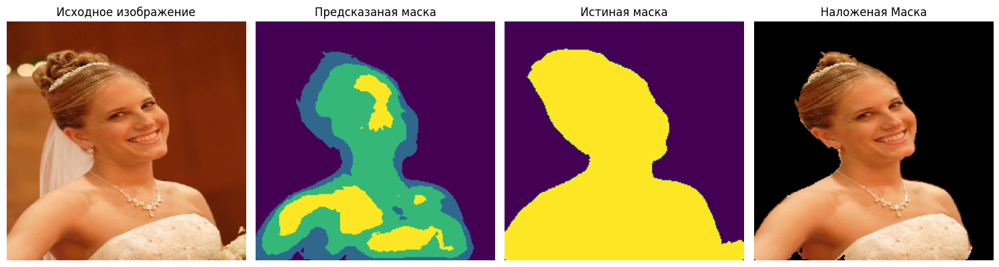

753/753 ━━━━━━━━━━━━━━━━━━━━ 868s 1s/step - IoU: 0.6939 - accuracy: 0.9863 - loss: 0.0363 - val_IoU: 0.5988 - val_accuracy: 0.9783 - val_loss: 0.0930
Epoch 37/40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step/step - IoU: 0.6709 - accuracy: 0.9847 - loss: 0.042


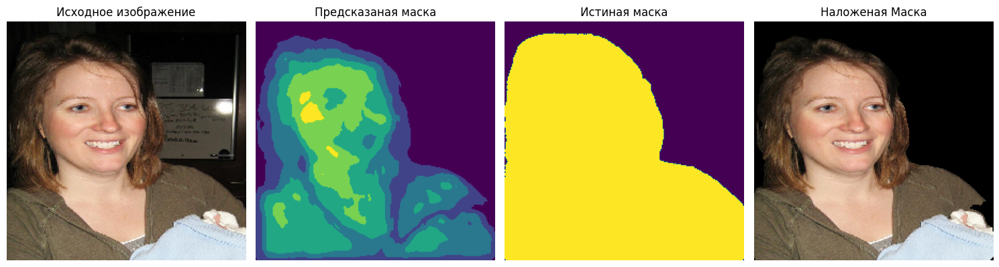

753/753 ━━━━━━━━━━━━━━━━━━━━ 879s 1s/step - IoU: 0.6706 - accuracy: 0.9847 - loss: 0.0424 - val_IoU: 0.6286 - val_accuracy: 0.9808 - val_loss: 0.0864


In [14]:
segmodel.compile(optimizer="nadam", loss="binary_crossentropy", metrics = [tf.keras.metrics.BinaryIoU(target_class_ids=[1], name="IoU"), 'accuracy'])
epochs = 40
hist = segmodel.fit(generator, epochs=epochs, batch_size=32, callbacks=[callback], validation_data=valid)

## Провекрка метрик на валидационой и тестовой выборке

In [16]:
res_val = segmodel.evaluate(valid)

322/322 ━━━━━━━━━━━━━━━━━━━━ 261s 810ms/step - IoU: 0.7205 - accuracy: 0.9722 - loss: 0.0961


In [17]:
res_test = segmodel.evaluate(generator)

753/753 ━━━━━━━━━━━━━━━━━━━━ 594s 788ms/step - IoU: 0.5827 - accuracy: 0.9763 - loss: 0.0652


## Графики Метрик и Лосов

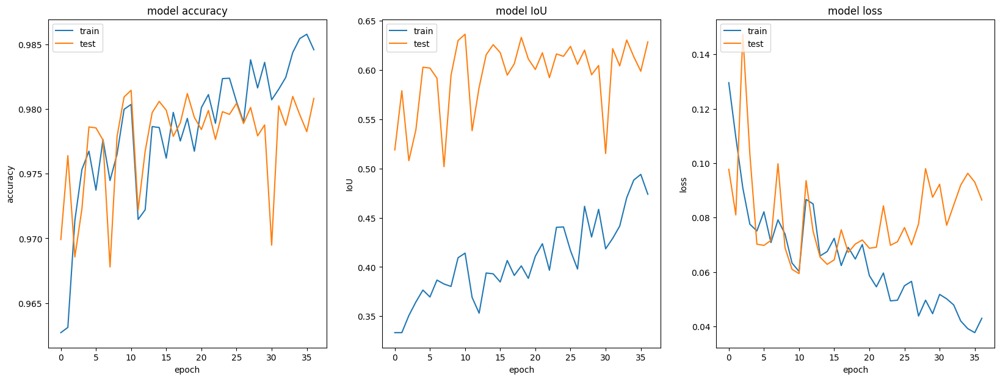

In [18]:
plt.figure(figsize=(20, 7))
plt.subplot(1,3,1)

# summarize history for accuracy
plt.subplot(1,3,1)
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])

plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')

plt.subplot(1,3,2)
plt.plot(hist.history['IoU'])
plt.plot(hist.history['val_IoU'])

plt.title('model IoU')
plt.ylabel('IoU')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')

plt.subplot(1,3,3)
# summarize history for loss
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])

plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')

plt.show()

## VS rembg

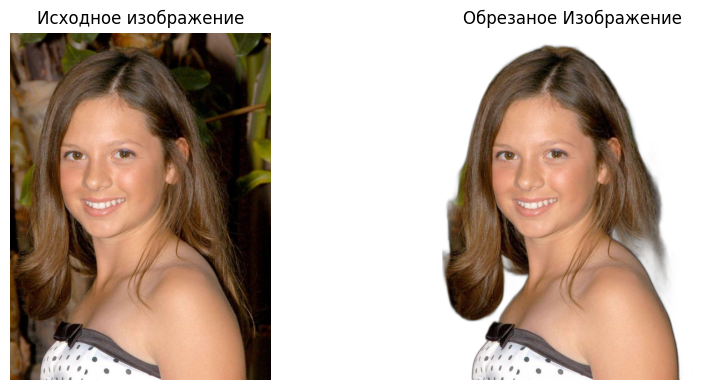

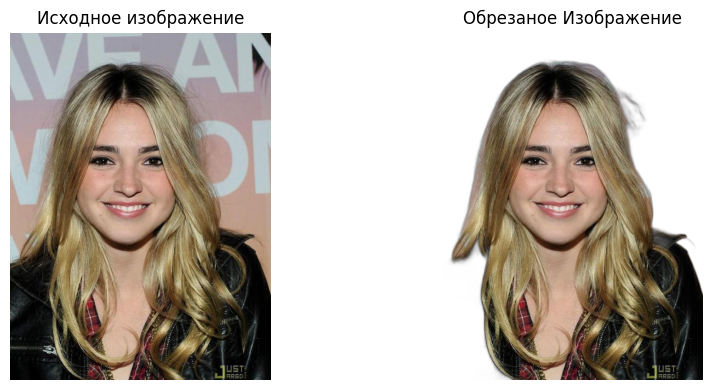

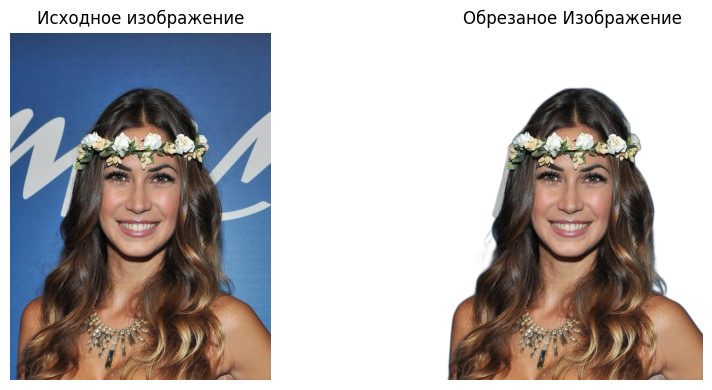

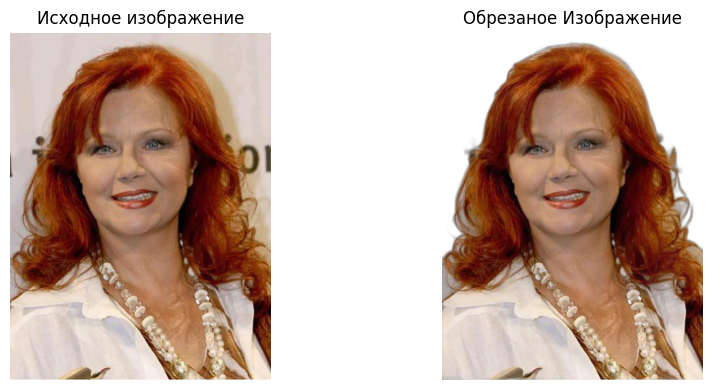

In [12]:
for el in img[:4]:
    plt.figure(figsize=(10,4))
    
    plt.subplot(1,2,1)
    ShowImage(plt.imread(el),title="Исходное изображение")
    
    output_path = "out.png"
    input_1 = Image.open(el)
    output = remove(input_1)
    plt.subplot(1,2,2)
    ShowImage(output, title="Обрезаное Изображение")
    

    plt.tight_layout()
    plt.show()
    

In [14]:
valid_mini = DataGenerator(X_test[0:9] ,y_test[0:9], batch_size=7, dim=(224,224,3))
mini_pred = segmodel.predict(valid_mini)

1/1 ━━━━━━━━━━━━━━━━━━━━ 24s 24s/step


I0000 00:00:1725616563.963866     143 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


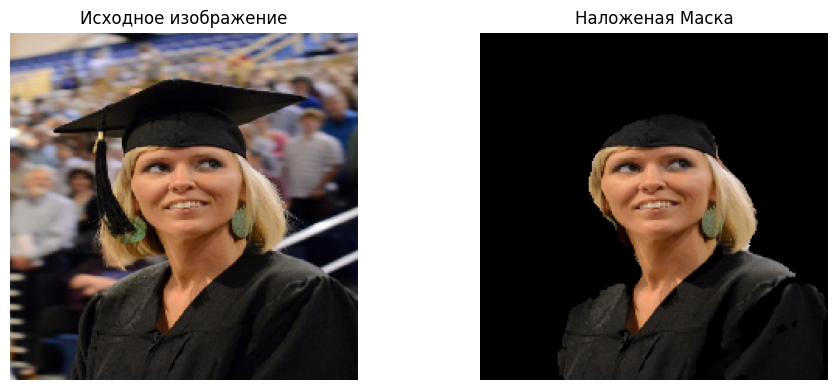

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


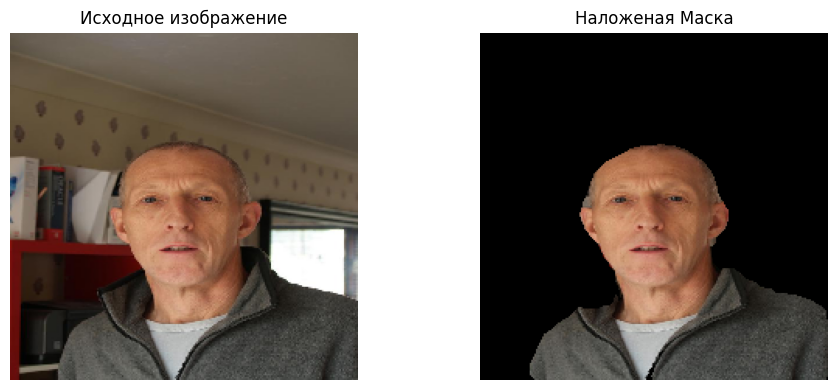

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


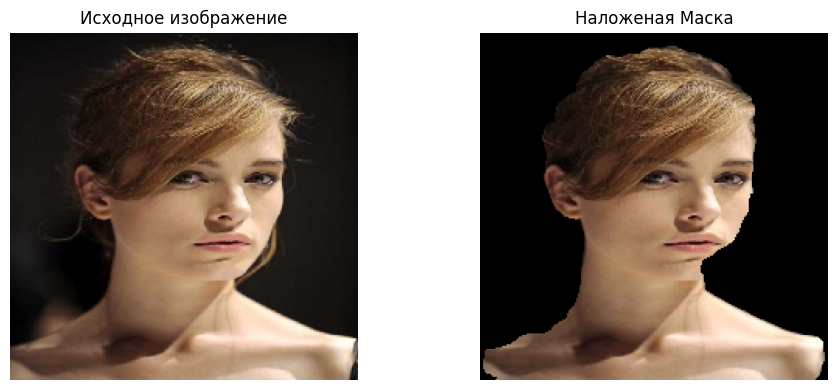

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


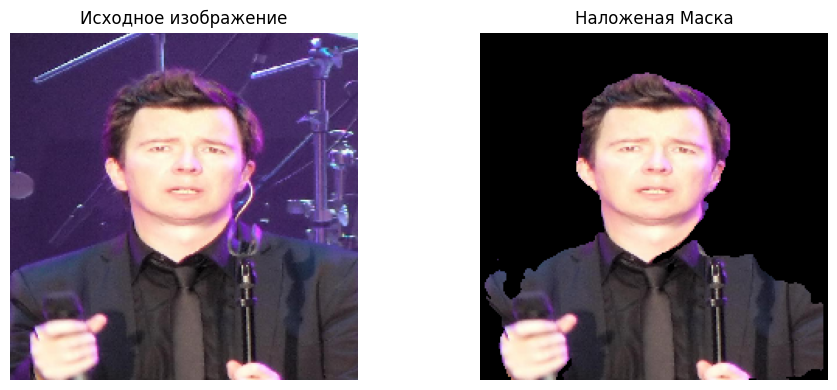

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


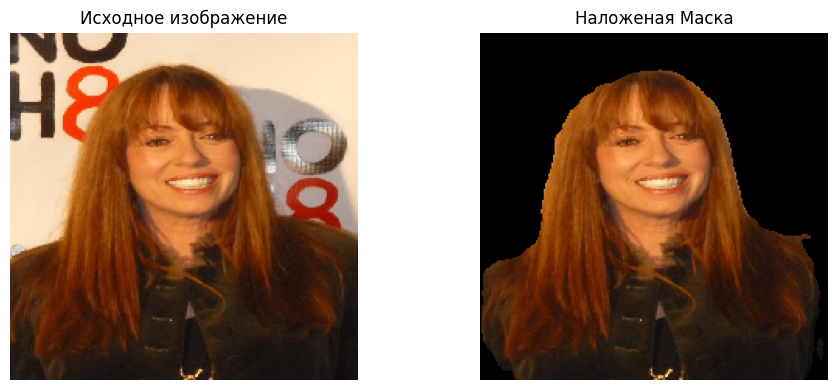

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


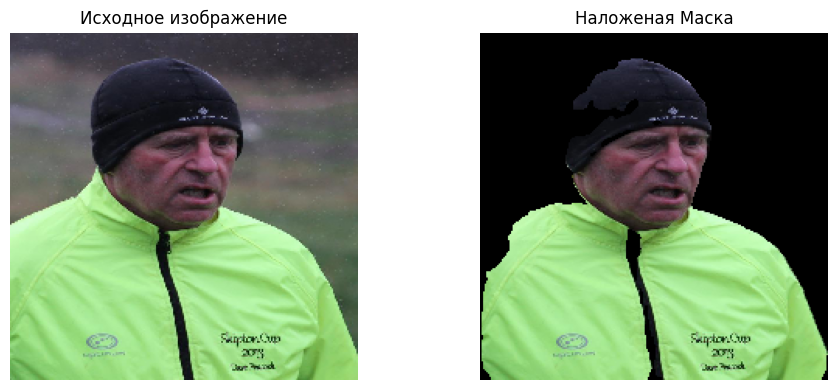

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


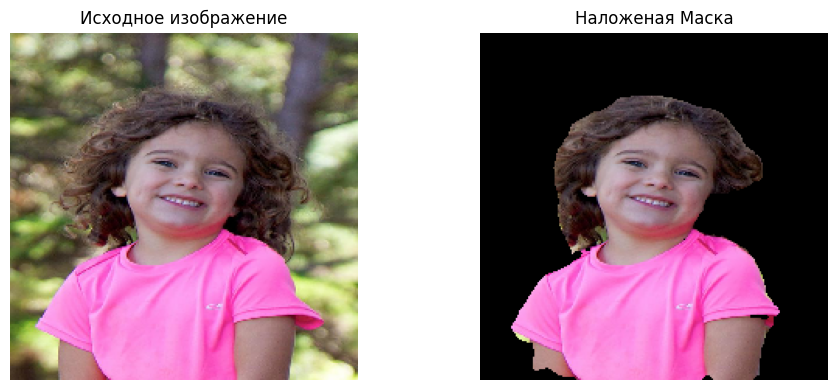

In [16]:
for i in range(len(mini_pred)):
    plt.figure(figsize=(10,4))
    img = valid_mini[0][0][0:7] # так как метод предикт принимает только от 2х и более картинок
    pred_mask = segmodel.predict(img)[i] #[i-1]
        
    pred_mask = np.array(pred_mask, dtype="uint8").reshape(224,224)
    mapping = cv.bitwise_and(img[i],img[i],mask=pred_mask)#[0]  i-2 i-2

    plt.subplot(1,2,1)
    ShowImage(img[i],title="Исходное изображение")
    
    plt.subplot(1,2,2)
    ShowImage(mapping, title="Наложеная Маска")
    
    plt.tight_layout()
    plt.show()

## Сохранение модели

In [95]:
segmodel.save('/kaggle/models/segmodel.h5')

In [66]:
download_file('/kaggle/working/', 'bg_hum_model_v2_5_efb0_24e_2_14.h5')

/kaggle/working/bg_hum_model_v2_5_efb0_24e_2_14.h5.zip

In [272]:
segmodel.save('/kaggle/models/models/segmodel.h5')